In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install plotly

# Выбор области

In [ ]:
x_from = -12
x_to   =  12
y_from = -12
y_to   =  12
delta  =  0.05

In [ ]:
x_points = int((x_to - x_from) / delta) + 1
y_points = int((y_to - y_from) / delta) + 1

In [ ]:
import numpy as np

f = open('input.txt','w')
for i in np.linspace(x_from, x_to, x_points):
    for j in np.linspace(y_from, y_to, y_points):
        f.write(str(i) + ' ' + str(j) + '\n')
f.close()

In [ ]:
dist = np.loadtxt('/content/drive/My Drive/plst_dstr.txt')
dist = dist.reshape(x_points, y_points)

In [ ]:
import plotly.graph_objects as go
import numpy as np

x, y = np.meshgrid(np.linspace(x_from, x_to, x_points), np.linspace(y_from, y_to, y_points))
z = dist

fig = go.Figure(data=go.Surface(x=x, y=y, z=z, colorscale='Viridis'))

fig.update_layout(
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)
fig.show()

In [ ]:
dist = dist * delta * delta
P = dist.sum()
print("Вероятность на прямоугольнике [{}; {}]х[{}; {}] = {}.".format(x_from, x_to, y_from, y_to, P))

Вероятность на прямоугольнике [-12; 12]х[-12; 12] = 0.9920610374588046.


# Генерация точки

In [ ]:
def get_sum(threshold, values):
    i = 0
    sum = values[0]
    while (i < values.size - 1) and (sum < threshold):
        i += 1
        sum += values[i]
    if (i + 1 < values.size) and (threshold - sum > sum + values[i + 1] - threshold):
        i += 1
        sum += values[i]
    return sum, i

In [ ]:
from random import random

def get_coord(x_from, y_from, delta, x_axis_sum, dist):
    rand_1 = random()
    rand_2 = random()
    X_sum, i = get_sum(rand_1 * P, x_axis_sum)
    Y_sum, j = get_sum(rand_2 * P * np.sum(dist[i]), dist[i])
    return x_from + i * delta, y_from + j * delta

In [ ]:
x_axis_sum = np.sum(dist, axis=0)
x_coord = []
y_coord = []

for i in range(10000000):
    X, Y = get_coord(x_from, y_from, delta, x_axis_sum, dist)
    x_coord.append(X)
    y_coord.append(Y)

# Гистограмма

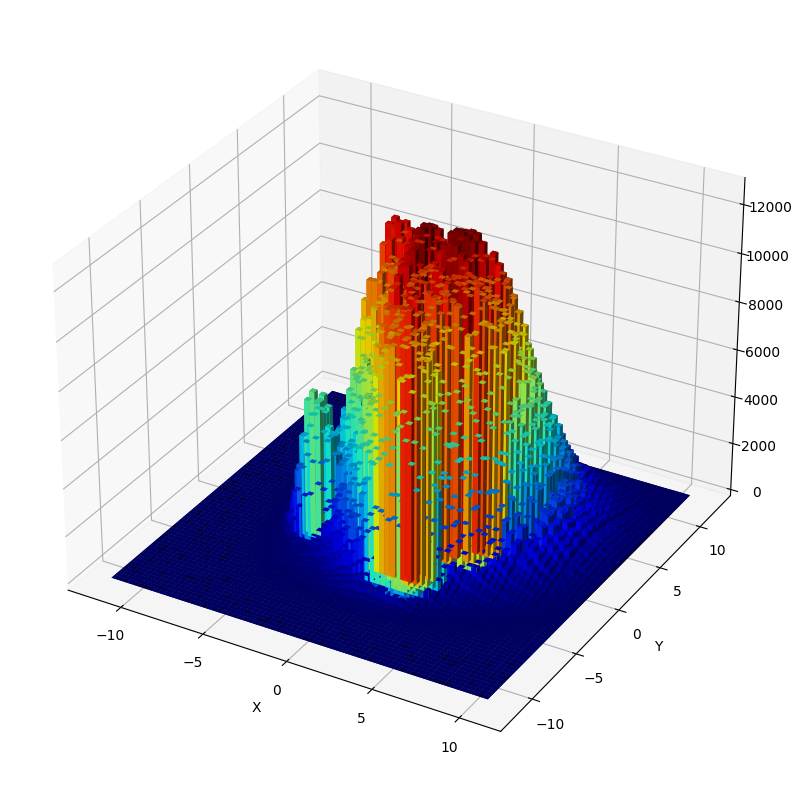

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import colormaps as cm

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

y = x_coord
x = y_coord

hist, xedges, yedges = np.histogram2d(x, y, bins=(70, 70))
xpos, ypos = np.meshgrid(xedges[:-1] + xedges[1:], yedges[:-1] + yedges[1:])

xpos = xpos.flatten() / 2.
ypos = ypos.flatten() / 2.

zpos = np.zeros_like (xpos)

dx = xedges [1] - xedges [0]
dy = yedges [1] - yedges [0]
dz = hist.flatten()

cmap = cm.get_cmap('jet') # Get desired colormap - you can change this!
max_height = np.max(dz)   # get range of colorbars so we can normalize
min_height = np.min(dz)
# scale each z to [0,1], and get their rgb values
rgba = [cmap((k-min_height)/max_height) for k in dz]

ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=rgba, zsort='average')
plt.xlabel ("X")
plt.ylabel ("Y")

plt.show()

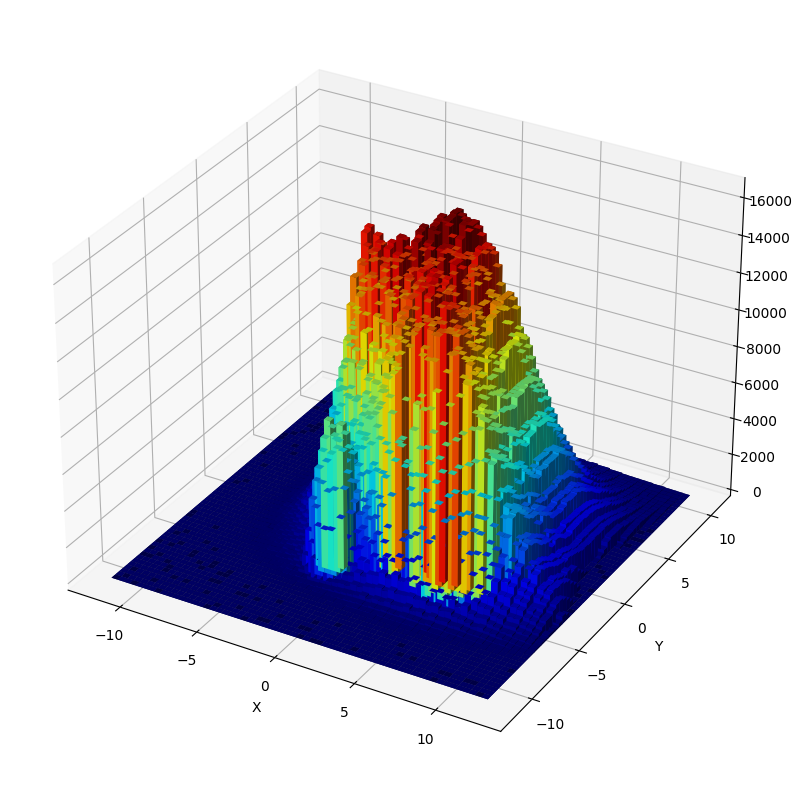

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import colormaps as cm

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

x = x_coord
y = y_coord

hist, xedges, yedges = np.histogram2d(x, y, bins=(60, 60))
xpos, ypos = np.meshgrid(xedges[:-1] + xedges[1:], yedges[:-1] + yedges[1:])

xpos = xpos.flatten() / 2.
ypos = ypos.flatten() / 2.

zpos = np.zeros_like (xpos)

dx = xedges [1] - xedges [0]
dy = yedges [1] - yedges [0]
dz = hist.flatten()

cmap = cm.get_cmap('jet') # Get desired colormap - you can change this!
max_height = np.max(dz)   # get range of colorbars so we can normalize
min_height = np.min(dz)
# scale each z to [0,1], and get their rgb values
rgba = [cmap((k-min_height)/max_height) for k in dz]

ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=rgba, zsort='average')
plt.xlabel ("X")
plt.ylabel ("Y")

plt.show()